In [1]:
import pandas as pd
import numpy as np
import umap
from sklearn.decomposition import PCA
from sklearn_extra.cluster import KMedoids
from sklearn.metrics import silhouette_samples, silhouette_score
import seaborn as sns
import matplotlib.pyplot as plt

/Users/andrewxu/Documents/2025/MD4/MLDE/MLDE_evolvepro/.env/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
# read in embeddings
embedding_df_with_label = pd.read_csv('output/dms/embeddings/jones_esm1b_t33_650M_UR50S.csv')
embedding_df = embedding_df_with_label.iloc[:, 1:]

In [3]:
# PCA
pca = PCA(n_components=10)
pca_embeddings = pca.fit_transform(embedding_df)

# convert to dataframe
pca_df = pd.DataFrame(pca_embeddings, columns=[f'PC{i+1}' for i in range(pca_embeddings.shape[1])])

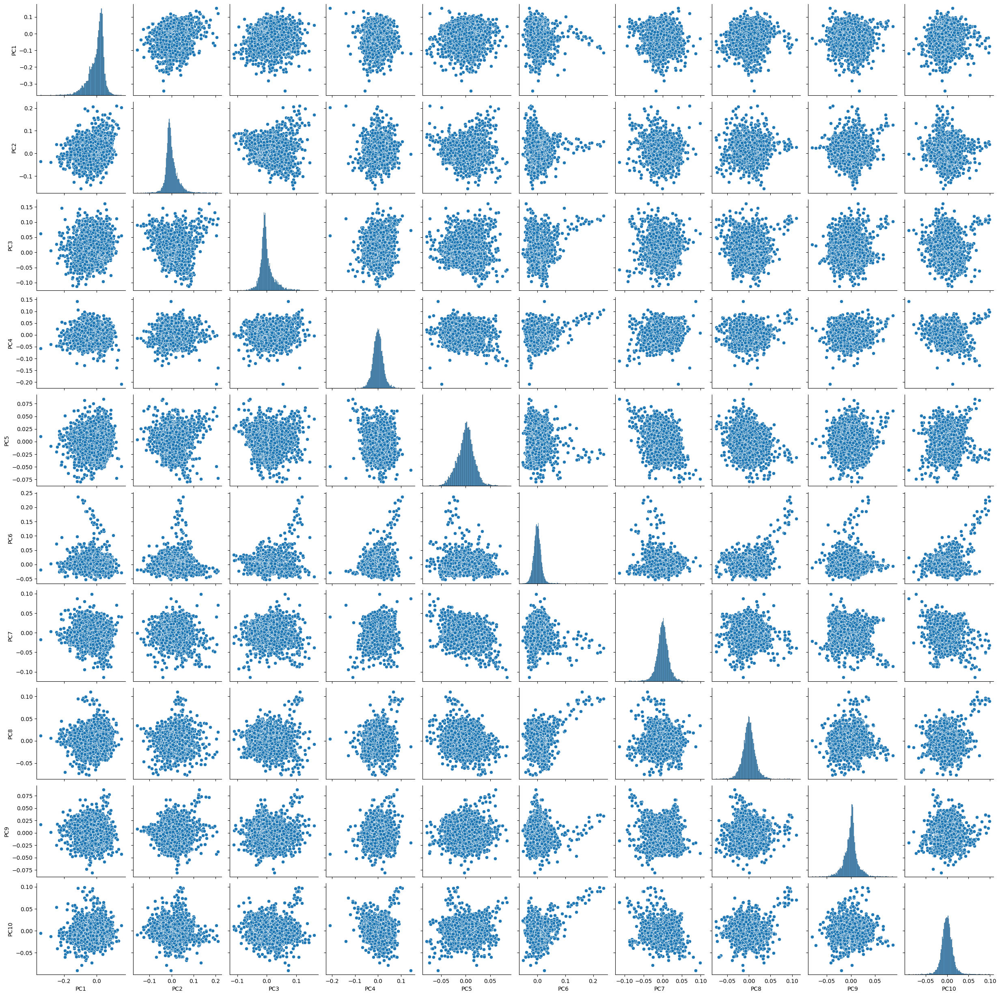

In [8]:
sns.pairplot(pca_df)

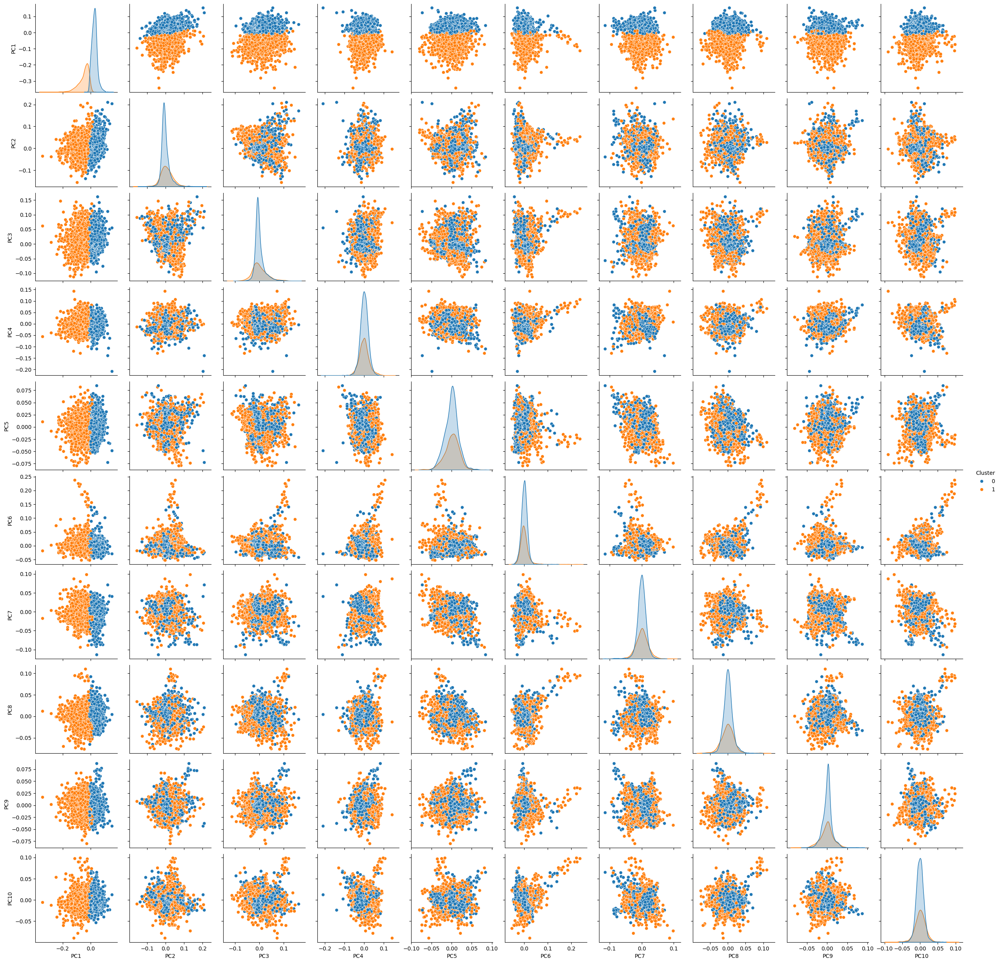

In [4]:
# perform K-medoids cluster on PCA embeddings
clusters = KMedoids(n_clusters = 2, metric='euclidean', random_state=42).fit(pca_embeddings)
pca_df['Cluster'] = clusters.labels_
sns.pairplot(pca_df, hue="Cluster")

In [10]:
# calculate silhouette scores
silhouette_vals = silhouette_samples(pca_embeddings, clusters.labels_)
avg_silhouette_score = silhouette_score(pca_embeddings, clusters.labels_)
print(f"Average silhouette score: {avg_silhouette_score:.2f}")

Average silhouette score: 0.29


In [11]:
for i in range(2, 10):
    clusters = KMedoids(n_clusters = i, metric='euclidean', random_state=42).fit(pca_embeddings)
    silhouette_vals = silhouette_samples(pca_embeddings, clusters.labels_)
    avg_silhouette_score = silhouette_score(pca_embeddings, clusters.labels_)
    print(f"Average silhouette score: {avg_silhouette_score:.2f}")

Average silhouette score: 0.29
Average silhouette score: 0.13
Average silhouette score: 0.07
Average silhouette score: 0.09
Average silhouette score: 0.06
Average silhouette score: 0.03
Average silhouette score: 0.04
Average silhouette score: 0.03


<Axes: ylabel='Silhouette'>

/Users/andrewxu/Documents/2025/MD4/MLDE/MLDE_evolvepro/.env/lib/python3.10/site-packages/IPython/core/events.py:82: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  func(*args, **kwargs)
/Users/andrewxu/Documents/2025/MD4/MLDE/MLDE_evolvepro/.env/lib/python3.10/site-packages/IPython/core/pylabtools.py:152: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


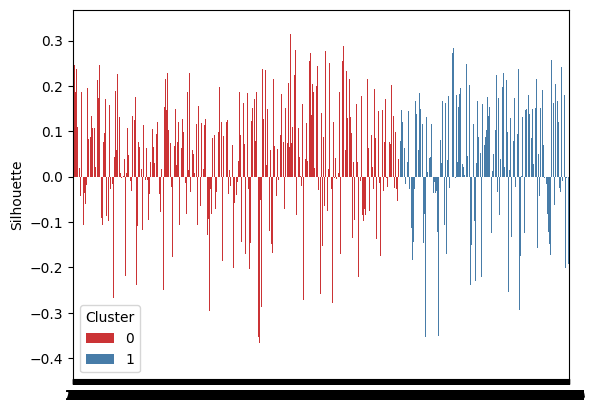

In [12]:
# plotting silhouette plot
pca_df['Silhouette'] = silhouette_vals
silhouette_plot_df = pca_df.sort_values(by='Cluster')
sns.barplot(
    x=np.arange(len(silhouette_plot_df)),
    y=silhouette_plot_df['Silhouette'],
    hue=silhouette_plot_df['Cluster'],
    dodge=False,
    palette='Set1'
)

In [5]:
# plotting pca by activity threshold
activity_df = pd.read_csv('output/dms/labels/jones_labels.csv')
embedding_df_with_label = pd.read_csv('output/dms/embeddings/jones_esm1b_t33_650M_UR50S.csv')
embedding_df_with_label['activity_binary'] = 0
for index, row in embedding_df_with_label.iterrows():
    mutation = row[0]
    activity = activity_df.loc[activity_df['variant'] == mutation, 'activity_scaled'].iloc[0]
    embedding_df_with_label.loc[index, 'activity_binary'] = activity

/var/folders/dh/zkvslqlx7yjcsf3ltw4jvr_m0000gn/T/ipykernel_20589/1354297462.py:6: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  mutation = row[0]
/var/folders/dh/zkvslqlx7yjcsf3ltw4jvr_m0000gn/T/ipykernel_20589/1354297462.py:8: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.3474935401899233' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  embedding_df_with_label.loc[index, 'activity_binary'] = activity
/var/folders/dh/zkvslqlx7yjcsf3ltw4jvr_m0000gn/T/ipykernel_20589/1354297462.py:6: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value 

In [7]:
pca_df

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,Cluster,activity
0,-0.024612,0.003510,-0.000070,-0.052303,-0.000177,-0.011301,-0.005665,-0.003705,-0.004300,0.014304,1,0.347494
1,0.023876,0.013335,0.007581,0.013560,0.003094,0.003696,0.027994,0.019009,-0.016002,0.009882,0,0.129008
2,0.034319,-0.003466,0.012236,0.014518,0.003170,0.004585,0.029602,0.019695,-0.012426,0.005526,0,0.238251
3,-0.031290,0.056504,-0.026624,-0.029576,0.003499,-0.012006,-0.003619,-0.007454,-0.016515,-0.002463,1,0.159358
4,-0.015722,-0.023306,0.022248,-0.013335,0.012999,0.006634,0.021460,0.008440,-0.001755,0.008227,1,0.187112
...,...,...,...,...,...,...,...,...,...,...,...,...
7795,-0.006798,-0.056855,0.050620,-0.030819,-0.000342,-0.000832,0.003346,-0.000223,-0.021365,0.005386,0,0.221038
7796,0.019751,-0.079260,0.081671,-0.038602,-0.000109,0.000667,0.028203,0.011732,0.005627,0.018681,0,0.200368
7797,0.006213,-0.097200,0.072307,-0.036382,0.000728,0.001190,0.025167,0.013230,0.007885,0.016420,0,0.281126
7798,0.039596,-0.105003,0.065628,-0.032062,-0.005149,-0.002686,0.021386,0.016202,0.011720,0.002511,0,0.346490


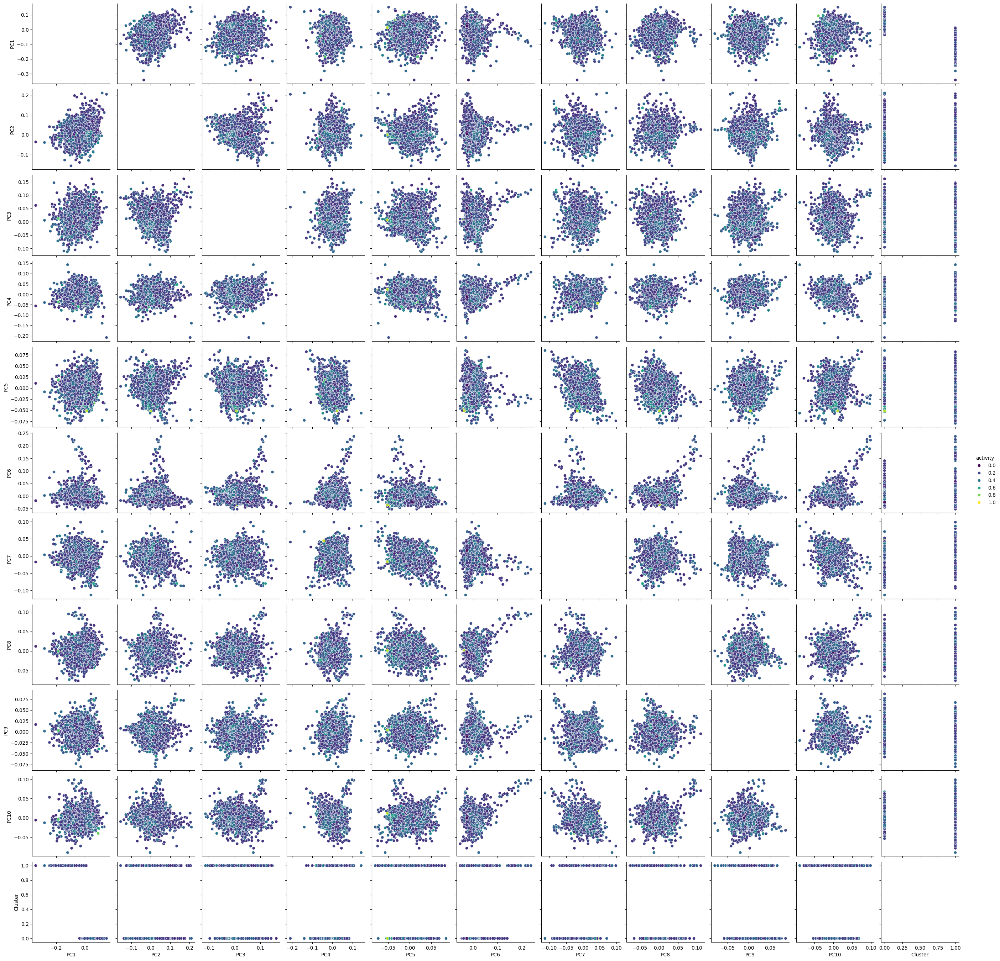

In [9]:
pca_df['activity'] = embedding_df_with_label['activity_binary']
sns.pairplot(pca_df, hue='activity', 
             vars=pca_df.columns[:-1],
             palette='viridis'
             )

In [15]:
# umap
umap = umap.UMAP(n_components=10, random_state=42)
umap_embeddings = umap.fit_transform(embedding_df)

# convert to dataframe
umap_df = pd.DataFrame(umap_embeddings, columns=[f'UMAP{i+1}' for i in range(umap_embeddings.shape[1])])

/Users/andrewxu/Documents/2025/MD4/MLDE/MLDE_evolvepro/.env/lib/python3.10/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/andrewxu/Documents/2025/MD4/MLDE/MLDE_evolvepro/.env/lib/python3.10/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


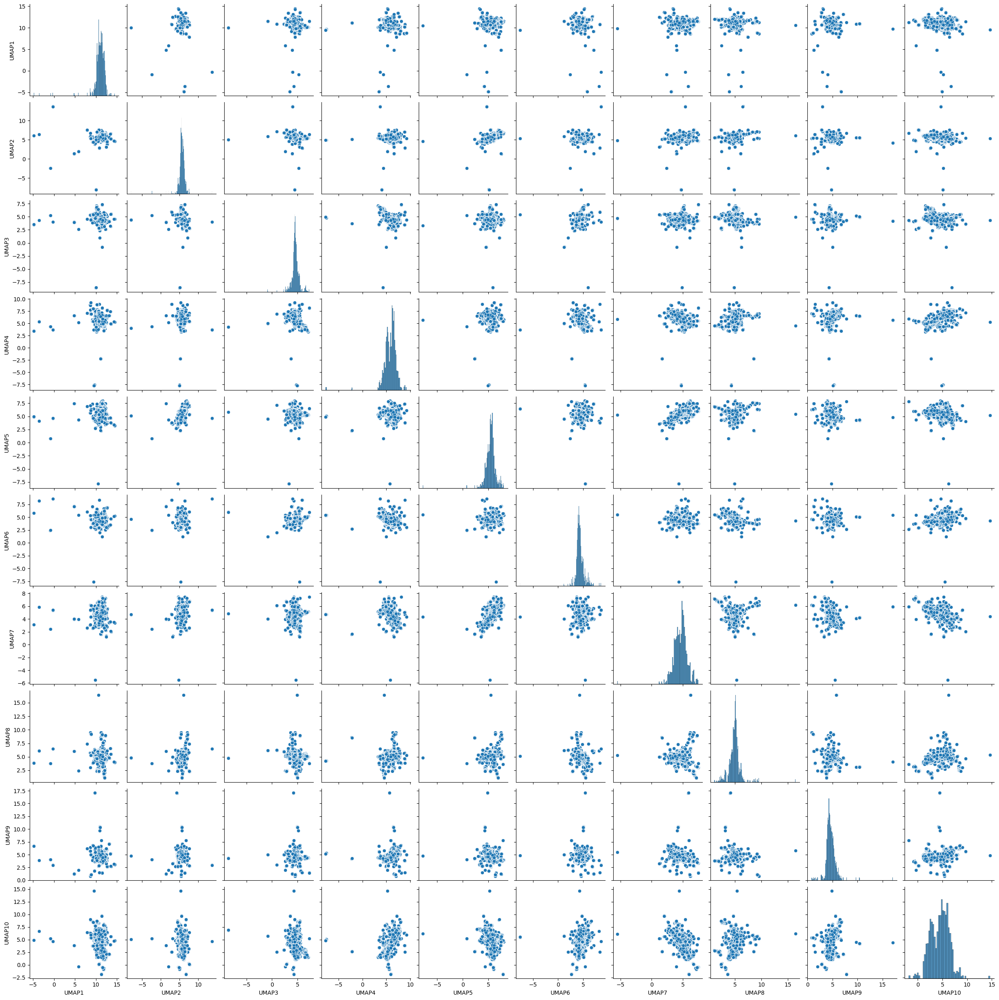

In [16]:
sns.pairplot(umap_df)

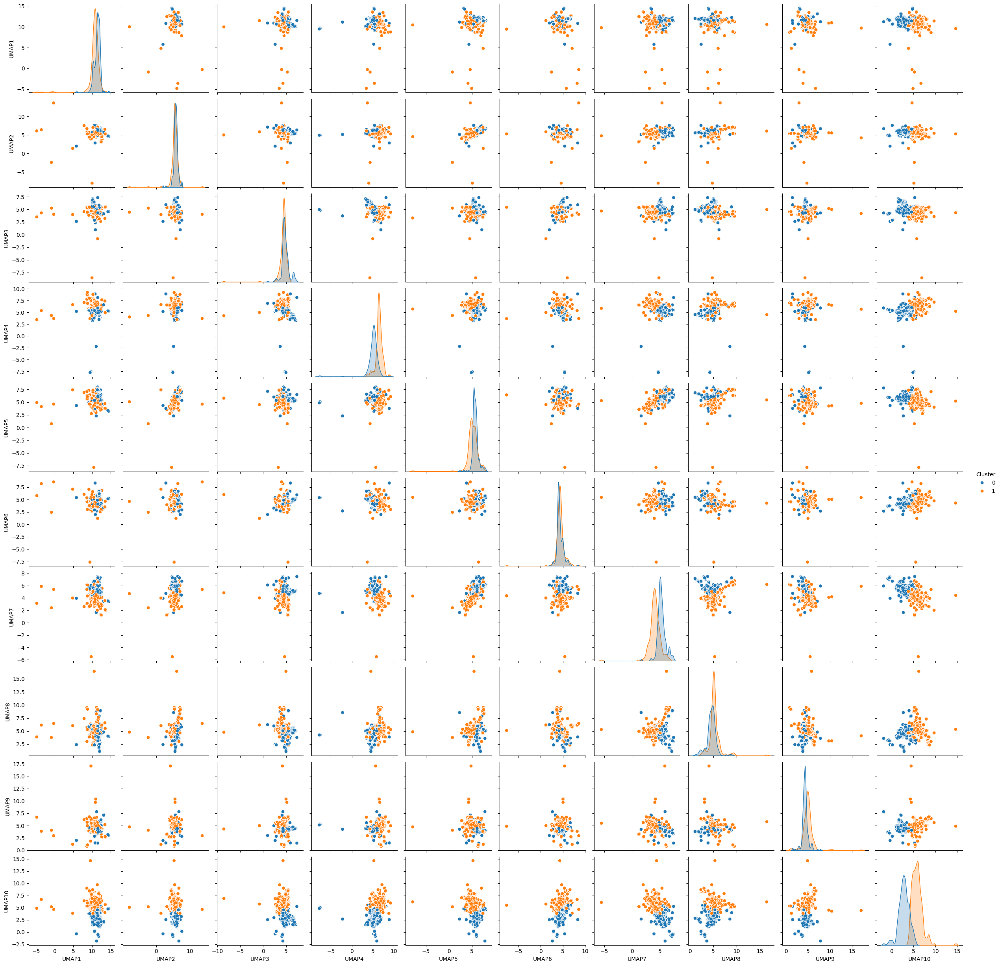

In [17]:
# perform K-medoids cluster on UMAP embeddings
clusters = KMedoids(n_clusters = 2, metric='euclidean', random_state=42).fit(umap_embeddings)
umap_df['Cluster'] = clusters.labels_
sns.pairplot(umap_df, hue="Cluster")

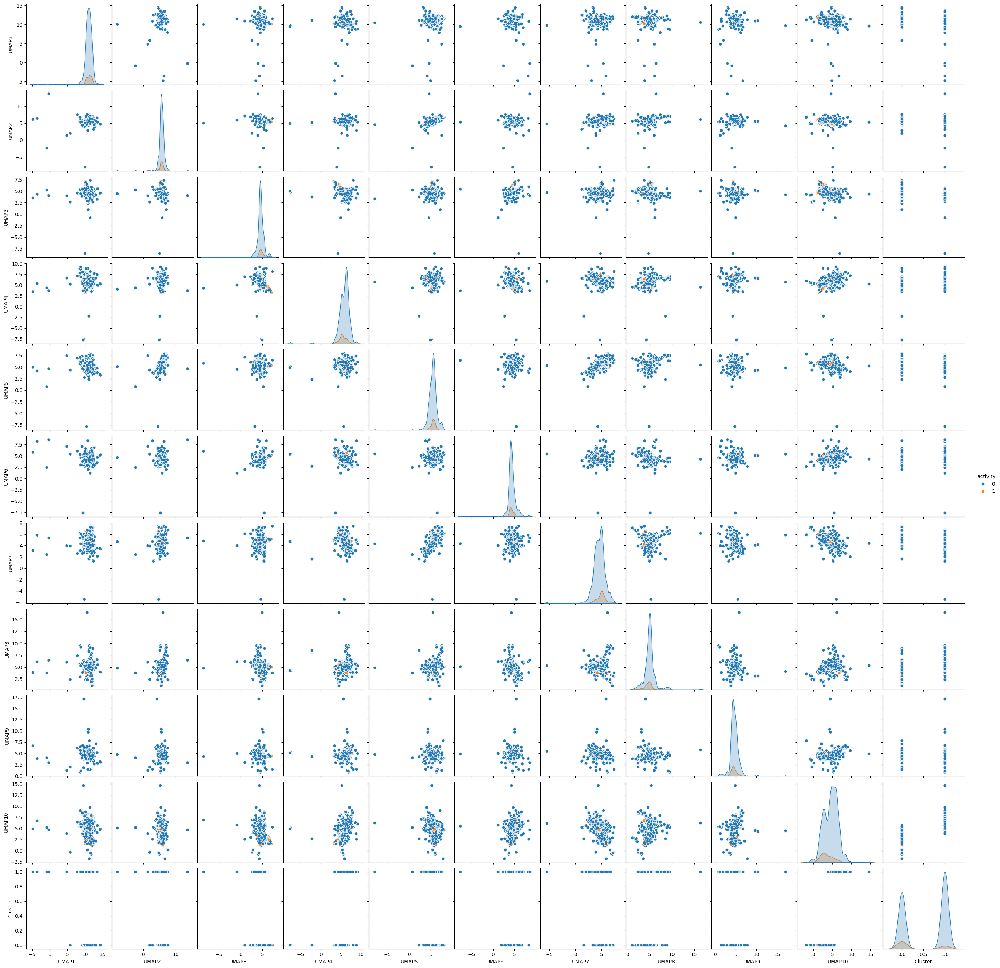

In [18]:
umap_df['activity'] = embedding_df_with_label['activity_binary']
sns.pairplot(umap_df, hue="activity")